# EyePACS Dataset — EDA & Ben Graham Preprocessing

**Purpose (Phase B):** Preprocess the EyePACS fundus images into the same 512×512 PNG format
expected by the APTOS pipeline, so they can be used for contrastive pre-training.

**Pipeline:**
1. EDA — Understand the raw dataset before touching it
2. Preprocessing — Apply Ben Graham local-contrast normalization (same `src/dataset.py` function)
3. Output — Save PNGs + write `data/eyepacs_labels.csv` in `id_code,diagnosis` format

---
**Note:** All actual disk writes happen in Section 4 (`PREPROCESSING RUN`).  
Sections 1–3 are read-only EDA and preview.

## 0 — Setup & Paths

In [1]:
from __future__ import annotations

import csv
import multiprocessing
import os
import sys
import warnings
from collections import Counter
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm

warnings.filterwarnings("ignore")

# ── project root on path so src.* imports work ──────────────────────────────
ROOT_DIR = Path(".").resolve().parent
if str(ROOT_DIR) not in sys.path:
    sys.path.insert(0, str(ROOT_DIR))

from src.dataset import ben_graham_preprocess

# ── EyePACS raw inputs ───────────────────────────────────────────────────────
EYEPACS_DIR       = ROOT_DIR / "Eyepacs"
RAW_CSV           = EYEPACS_DIR / "trainLabels_cropped.csv"      # has Unnamed:0 extra col
RAW_IMG_DIR       = EYEPACS_DIR / "resized_train_cropped" / "resized_train_cropped"
IMG_EXT           = ".jpeg"

# ── Output ──────────────────────────────────────────────────────────────────
OUTPUT_IMG_DIR    = ROOT_DIR / "data" / "eyepacs_processed"
OUTPUT_CSV        = ROOT_DIR / "data" / "eyepacs_labels.csv"
FAILED_LOG        = ROOT_DIR / "data" / "eyepacs_failed.txt"
IMAGE_SIZE        = 512
NUM_WORKERS       = max(1, multiprocessing.cpu_count() - 1)

# ── APTOS reference for comparison ──────────────────────────────────────────
APTOS_TRAIN_CSV   = ROOT_DIR / "data" / "train_label.csv"
APTOS_IMG_DIR     = ROOT_DIR / "data" / "train_split"

CLASS_NAMES = ["No DR", "Mild", "Moderate", "Severe", "Proliferative"]
CLASS_COLORS = ["#4CAF50", "#8BC34A", "#FFC107", "#FF5722", "#F44336"]

print(f"ROOT_DIR     : {ROOT_DIR}")
print(f"RAW_IMG_DIR  : {RAW_IMG_DIR}")
print(f"NUM_WORKERS  : {NUM_WORKERS}")
print(f"cv2 version  : {cv2.__version__}")

ROOT_DIR     : C:\Projects\dr-nrt
RAW_IMG_DIR  : C:\Projects\dr-nrt\Eyepacs\resized_train_cropped\resized_train_cropped
NUM_WORKERS  : 15
cv2 version  : 4.13.0


## 1 — EDA: Labels

### 1.1 — Load and inspect the CSV

In [2]:
# trainLabels_cropped.csv has a junk Unnamed: 0 column from pandas index=True export.
# We read only the columns we need.
df_raw = pd.read_csv(RAW_CSV)
print(f"Raw CSV shape : {df_raw.shape}")
print(f"Raw columns   : {df_raw.columns.tolist()}")
df_raw.head(10)

Raw CSV shape : (35108, 4)
Raw columns   : ['Unnamed: 0.1', 'Unnamed: 0', 'image', 'level']


,Unnamed: 0.1,Unnamed: 0,image,level
0,0,0,10_left,0
1,1,1,10_right,0
2,2,2,13_left,0
3,3,3,13_right,0
4,4,4,15_left,1
5,5,5,15_right,2
6,6,6,16_left,4
7,7,7,16_right,4
8,8,8,17_left,0
9,9,9,17_right,1


In [3]:
# Keep only image + level, rename to match APTOS pipeline
df = df_raw[["image", "level"]].copy()
df.columns = ["id_code", "diagnosis"]
df["diagnosis"] = df["diagnosis"].astype(int)

print(f"Total records         : {len(df):,}")
print(f"Unique image IDs      : {df['id_code'].nunique():,}")
print(f"Duplicate entries     : {df.duplicated('id_code').sum()}")
print(f"Null values           : {df.isnull().sum().to_dict()}")
print()
print("First 5 rows:")
df.head()

Total records         : 35,108
Unique image IDs      : 35,108
Duplicate entries     : 0
Null values           : {'id_code': 0, 'diagnosis': 0}

First 5 rows:


,id_code,diagnosis
0,10_left,0
1,10_right,0
2,13_left,0
3,13_right,0
4,15_left,1


### 1.2 — Class distribution

In [4]:
counts = df["diagnosis"].value_counts().sort_index()
print("EyePACS class distribution:")
for cls, name in enumerate(CLASS_NAMES):
    n = counts.get(cls, 0)
    pct = 100 * n / len(df)
    bar = "█" * int(pct / 2)
    print(f"  [{cls}] {name:<18} {n:>6,}  ({pct:5.1f}%)  {bar}")
print(f"  {'TOTAL':<22} {len(df):>6,}")

EyePACS class distribution:
  [0] No DR              25,802  ( 73.5%)  ████████████████████████████████████
  [1] Mild                2,438  (  6.9%)  ███
  [2] Moderate            5,288  ( 15.1%)  ███████
  [3] Severe                872  (  2.5%)  █
  [4] Proliferative         708  (  2.0%)  █
  TOTAL                  35,108


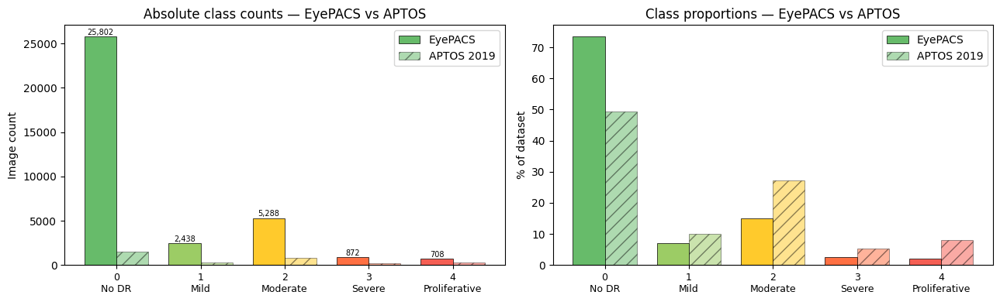

Saved: results/eyepacs_class_distribution.png


In [5]:
# ── Side-by-side: EyePACS vs APTOS class distributions ─────────────────────
df_aptos = pd.read_csv(APTOS_TRAIN_CSV)
aptos_counts = df_aptos["diagnosis"].value_counts().sort_index()

x = np.arange(5)
w = 0.38

fig, axes = plt.subplots(1, 2, figsize=(13, 4))

# Absolute counts
ax = axes[0]
bars1 = ax.bar(x - w/2, counts.values, w, label="EyePACS", color=CLASS_COLORS, alpha=0.85, edgecolor="black", linewidth=0.6)
bars2 = ax.bar(x + w/2, aptos_counts.values, w, label="APTOS 2019", color=CLASS_COLORS, alpha=0.45, edgecolor="black", linewidth=0.6, hatch="//")
ax.set_xticks(x)
ax.set_xticklabels([f"{n}\n{c}" for n, c in enumerate(CLASS_NAMES)], fontsize=9)
ax.set_ylabel("Image count")
ax.set_title("Absolute class counts — EyePACS vs APTOS")
ax.legend()
for bar in bars1:
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 50,
            f"{int(bar.get_height()):,}", ha="center", va="bottom", fontsize=7)

# Proportions
ax2 = axes[1]
eyepacs_pct = counts.values / counts.values.sum() * 100
aptos_pct   = aptos_counts.values / aptos_counts.values.sum() * 100
ax2.bar(x - w/2, eyepacs_pct, w, label="EyePACS",   color=CLASS_COLORS, alpha=0.85, edgecolor="black", linewidth=0.6)
ax2.bar(x + w/2, aptos_pct,   w, label="APTOS 2019", color=CLASS_COLORS, alpha=0.45, edgecolor="black", linewidth=0.6, hatch="//")
ax2.set_xticks(x)
ax2.set_xticklabels([f"{n}\n{c}" for n, c in enumerate(CLASS_NAMES)], fontsize=9)
ax2.set_ylabel("% of dataset")
ax2.set_title("Class proportions — EyePACS vs APTOS")
ax2.legend()

plt.tight_layout()
plt.savefig(ROOT_DIR / "results" / "eyepacs_class_distribution.png", dpi=120, bbox_inches="tight")
plt.show()
print("Saved: results/eyepacs_class_distribution.png")

### 1.3 — Left eye vs Right eye balance

In [6]:
df["side"] = df["id_code"].str.extract(r"_(left|right)$")[0]
df["patient_id"] = df["id_code"].str.replace(r"_(left|right)$", "", regex=True)

side_counts = df["side"].value_counts()
print("Eye side distribution:")
print(side_counts.to_string())

# Are any patients missing one eye?
patient_sides = df.groupby("patient_id")["side"].apply(set)
only_left  = (patient_sides == {"left"}).sum()
only_right = (patient_sides == {"right"}).sum()
both       = (patient_sides == {"left", "right"}).sum()
print(f"\nPatients with both eyes : {both:,}")
print(f"Patients with left only : {only_left:,}")
print(f"Patients with right only: {only_right:,}")

Eye side distribution:
side
right    17560
left     17548

Patients with both eyes : 17,547
Patients with left only : 1
Patients with right only: 13


Patients with paired eyes: 17,547
Same grade both eyes     : 87.3%
Within 1 grade           : 95.7%


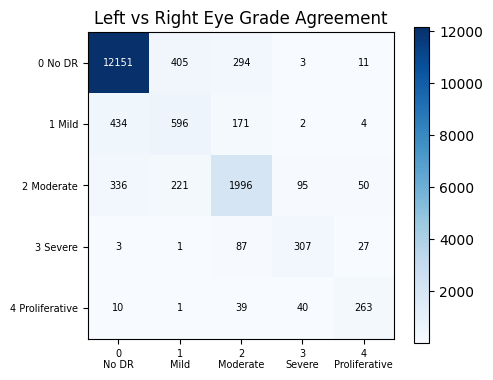

In [7]:
# Grading agreement between eyes of the same patient
df_left  = df[df["side"] == "left" ].set_index("patient_id")[["diagnosis"]].rename(columns={"diagnosis": "grade_left"})
df_right = df[df["side"] == "right"].set_index("patient_id")[["diagnosis"]].rename(columns={"diagnosis": "grade_right"})
df_pair  = df_left.join(df_right, how="inner")

agree     = (df_pair["grade_left"] == df_pair["grade_right"]).mean() * 100
within_1  = (abs(df_pair["grade_left"] - df_pair["grade_right"]) <= 1).mean() * 100

print(f"Patients with paired eyes: {len(df_pair):,}")
print(f"Same grade both eyes     : {agree:.1f}%")
print(f"Within 1 grade           : {within_1:.1f}%")

# Heatmap of left vs right grades
import matplotlib.ticker as mticker
confusion = pd.crosstab(df_pair["grade_left"], df_pair["grade_right"],
                        rownames=["Left eye grade"], colnames=["Right eye grade"])

fig, ax = plt.subplots(figsize=(5, 4))
im = ax.imshow(confusion.values, cmap="Blues")
ax.set_xticks(range(5))
ax.set_yticks(range(5))
ax.set_xticklabels([f"{i}\n{CLASS_NAMES[i]}" for i in range(5)], fontsize=7)
ax.set_yticklabels([f"{i} {CLASS_NAMES[i]}" for i in range(5)], fontsize=7)
ax.set_title("Left vs Right Eye Grade Agreement")
plt.colorbar(im, ax=ax)
for i in range(5):
    for j in range(5):
        val = confusion.values[i, j] if i < len(confusion.values) and j < confusion.values.shape[1] else 0
        ax.text(j, i, str(val), ha="center", va="center", fontsize=7,
                color="white" if val > confusion.values.max() * 0.6 else "black")
plt.tight_layout()
plt.savefig(ROOT_DIR / "results" / "eyepacs_eye_agreement.png", dpi=120, bbox_inches="tight")
plt.show()

## 2 — EDA: Image Files

### 2.1 — File existence audit

In [8]:
# Check every CSV row has a matching file on disk
df["img_path"] = df["id_code"].apply(lambda x: RAW_IMG_DIR / f"{x}{IMG_EXT}")
df["img_exists"] = df["img_path"].apply(lambda p: p.exists())

n_found   = df["img_exists"].sum()
n_missing = (~df["img_exists"]).sum()
print(f"CSV rows        : {len(df):,}")
print(f"Images found    : {n_found:,}")
print(f"Images MISSING  : {n_missing:,}")

if n_missing > 0:
    print("\nFirst 10 missing IDs:")
    print(df[~df["img_exists"]]["id_code"].head(10).tolist())

# Filter to only processable rows
df_valid = df[df["img_exists"]].reset_index(drop=True)
print(f"\nUsable rows for preprocessing: {len(df_valid):,}")

CSV rows        : 35,108
Images found    : 35,108
Images MISSING  : 0

Usable rows for preprocessing: 35,108


### 2.2 — Raw image dimensions and file sizes

Sampling images:   0%|          | 0/200 [00:00<?, ?it/s]


Height  — min: 683, max: 1029, mean: 913
Width   — min: 1024,  max: 1024,  mean: 1024
File KB — min: 97.8, max: 298.1, mean: 181.4


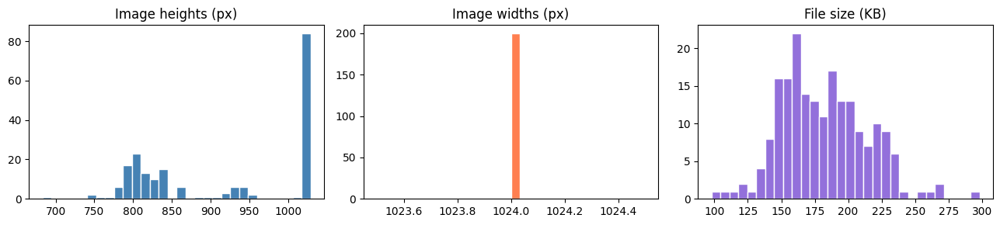

In [9]:
# Sample 200 random images to check dimensions and file sizes (avoid reading 35K images)
rng = np.random.default_rng(42)
sample_df = df_valid.sample(min(200, len(df_valid)), random_state=42).reset_index(drop=True)

heights, widths, filesizes_kb = [], [], []
for _, row in tqdm(sample_df.iterrows(), total=len(sample_df), desc="Sampling images"):
    p = row["img_path"]
    filesizes_kb.append(p.stat().st_size / 1024)
    img = cv2.imread(str(p))
    if img is not None:
        h, w = img.shape[:2]
        heights.append(h)
        widths.append(w)

print(f"\nHeight  — min: {min(heights)}, max: {max(heights)}, mean: {np.mean(heights):.0f}")
print(f"Width   — min: {min(widths)},  max: {max(widths)},  mean: {np.mean(widths):.0f}")
print(f"File KB — min: {min(filesizes_kb):.1f}, max: {max(filesizes_kb):.1f}, mean: {np.mean(filesizes_kb):.1f}")

fig, axes = plt.subplots(1, 3, figsize=(13, 3))
axes[0].hist(heights, bins=30, color="steelblue", edgecolor="white")
axes[0].set_title("Image heights (px)")
axes[1].hist(widths, bins=30, color="coral", edgecolor="white")
axes[1].set_title("Image widths (px)")
axes[2].hist(filesizes_kb, bins=30, color="mediumpurple", edgecolor="white")
axes[2].set_title("File size (KB)")
plt.tight_layout()
plt.savefig(ROOT_DIR / "results" / "eyepacs_raw_dimensions.png", dpi=120, bbox_inches="tight")
plt.show()

### 2.3 — Raw sample images by grade

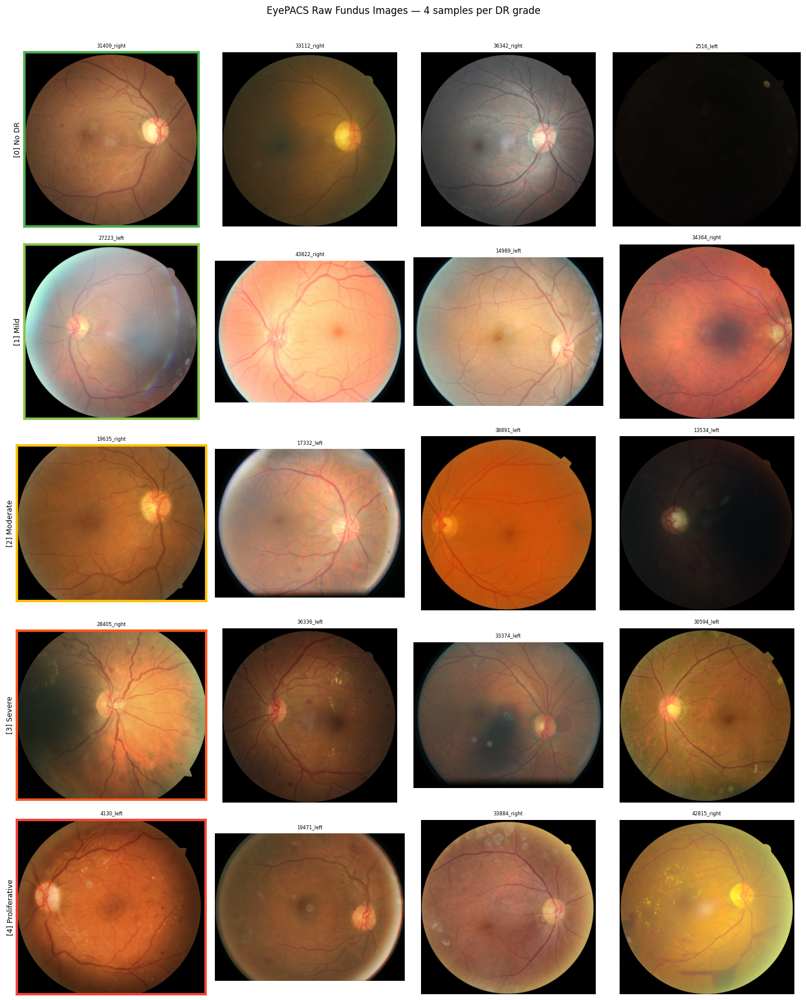

Saved: results/eyepacs_raw_samples.png


In [10]:
# Show 4 sample images per DR grade (raw, before preprocessing)
N_SAMPLES = 4
fig, axes = plt.subplots(5, N_SAMPLES, figsize=(14, 17))

for cls in range(5):
    cls_df = df_valid[df_valid["diagnosis"] == cls]
    samples = cls_df.sample(min(N_SAMPLES, len(cls_df)), random_state=cls).reset_index(drop=True)
    for j in range(N_SAMPLES):
        ax = axes[cls][j]
        if j < len(samples):
            img_bgr = cv2.imread(str(samples.loc[j, "img_path"]))
            if img_bgr is not None:
                img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
                ax.imshow(img_rgb)
                ax.set_title(f"{samples.loc[j, 'id_code']}", fontsize=6)
            else:
                ax.text(0.5, 0.5, "read error", ha="center", va="center")
        else:
            ax.text(0.5, 0.5, "N/A", ha="center", va="center")
        ax.axis("off")
        if j == 0:
            ax.set_ylabel(f"[{cls}] {CLASS_NAMES[cls]}", fontsize=9, rotation=90, labelpad=4)
            ax.axis("on")
            ax.set_xticks([])
            ax.set_yticks([])
            for spine in ax.spines.values():
                spine.set_edgecolor(CLASS_COLORS[cls])
                spine.set_linewidth(3)

fig.suptitle("EyePACS Raw Fundus Images — 4 samples per DR grade", fontsize=12, y=1.01)
plt.tight_layout()
plt.savefig(ROOT_DIR / "results" / "eyepacs_raw_samples.png", dpi=100, bbox_inches="tight")
plt.show()
print("Saved: results/eyepacs_raw_samples.png")

### 2.4 — Mean pixel intensity by grade

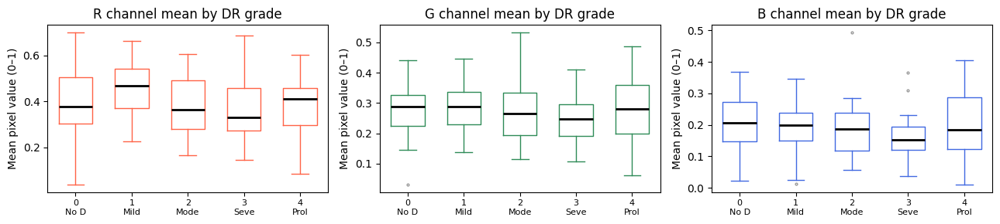

In [11]:
# Sample 30 images per class, compute per-channel mean and std
N_PER_CLASS = 30
stats_rows = []

for cls in range(5):
    cls_df = df_valid[df_valid["diagnosis"] == cls].sample(
        min(N_PER_CLASS, len(df_valid[df_valid["diagnosis"] == cls])), random_state=0
    )
    for _, row in cls_df.iterrows():
        img = cv2.imread(str(row["img_path"]))
        if img is None:
            continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
        stats_rows.append({
            "diagnosis": cls,
            "mean_r": img[:, :, 0].mean(),
            "mean_g": img[:, :, 1].mean(),
            "mean_b": img[:, :, 2].mean(),
            "std_r":  img[:, :, 0].std(),
        })

df_stats = pd.DataFrame(stats_rows)

fig, axes = plt.subplots(1, 3, figsize=(13, 3))
for i, (ch, color) in enumerate(zip(["mean_r", "mean_g", "mean_b"], ["tomato", "seagreen", "royalblue"])):
    for cls in range(5):
        vals = df_stats[df_stats["diagnosis"] == cls][ch]
        axes[i].boxplot(vals, positions=[cls], widths=0.6,
                        boxprops=dict(color=color),
                        medianprops=dict(color="black", linewidth=2),
                        whiskerprops=dict(color=color),
                        capprops=dict(color=color),
                        flierprops=dict(marker="o", markersize=2, alpha=0.4))
    axes[i].set_xticks(range(5))
    axes[i].set_xticklabels([f"{n}\n{c[:4]}" for n, c in enumerate(CLASS_NAMES)], fontsize=8)
    axes[i].set_title(f"{ch.replace('mean_', '').upper()} channel mean by DR grade")
    axes[i].set_ylabel("Mean pixel value (0–1)")

plt.tight_layout()
plt.savefig(ROOT_DIR / "results" / "eyepacs_channel_stats.png", dpi=120, bbox_inches="tight")
plt.show()

## 3 — Preprocessing Preview (before full run)

### 3.1 — Ben Graham pipeline: step-by-step visual

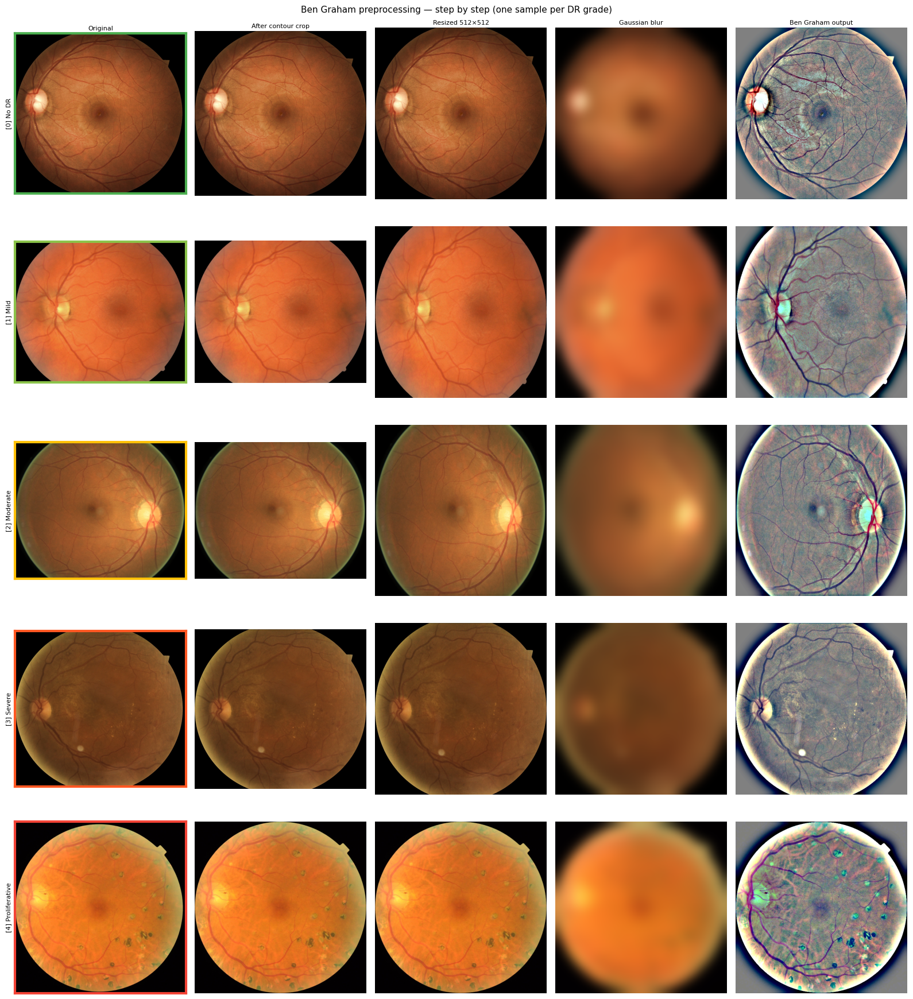

Saved: results/eyepacs_preprocessing_steps.png


In [12]:
def preprocess_steps(img_rgb: np.ndarray, size: int = 512):
    """Return intermediate steps so we can visualise each stage."""
    # Step 1: contour crop
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    _, thresh = cv2.threshold(gray, 10, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cropped = img_rgb.copy()
    if contours:
        largest = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(largest)
        cropped = img_rgb[y:y+h, x:x+w]

    # Step 2: resize to 512x512
    resized = cv2.resize(cropped, (size, size), interpolation=cv2.INTER_LINEAR)

    # Step 3: Gaussian blur (sigma = size/30)
    gauss = cv2.GaussianBlur(resized, (0, 0), sigmaX=size / 30)

    # Step 4: addWeighted — local contrast normalisation
    final = cv2.addWeighted(resized, 4, gauss, -4, 128)

    return {
        "Original": img_rgb,
        "After contour crop": cropped,
        "Resized 512×512": resized,
        "Gaussian blur": gauss,
        "Ben Graham output": final,
    }


# Pick one representative image per DR grade
demo_images = []
for cls in range(5):
    row = df_valid[df_valid["diagnosis"] == cls].iloc[2]
    img_bgr = cv2.imread(str(row["img_path"]))
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    demo_images.append((cls, row["id_code"], img_rgb))

step_keys = ["Original", "After contour crop", "Resized 512\u00d7512", "Gaussian blur", "Ben Graham output"]
n_steps = len(step_keys)

fig, axes = plt.subplots(5, n_steps, figsize=(16, 18))
for row_i, (cls, img_id, img_rgb) in enumerate(demo_images):
    steps = preprocess_steps(img_rgb, size=IMAGE_SIZE)
    for col_i, key in enumerate(step_keys):
        ax = axes[row_i][col_i]
        ax.imshow(steps[key])
        ax.axis("off")
        if row_i == 0:
            ax.set_title(key, fontsize=8, pad=4)
        if col_i == 0:
            ax.set_ylabel(f"[{cls}] {CLASS_NAMES[cls]}", fontsize=8)
            ax.axis("on")
            ax.set_xticks([])
            ax.set_yticks([])
            for spine in ax.spines.values():
                spine.set_edgecolor(CLASS_COLORS[cls])
                spine.set_linewidth(3)

fig.suptitle("Ben Graham preprocessing — step by step (one sample per DR grade)", fontsize=11)
plt.tight_layout()
plt.savefig(ROOT_DIR / "results" / "eyepacs_preprocessing_steps.png", dpi=100, bbox_inches="tight")
plt.show()
print("Saved: results/eyepacs_preprocessing_steps.png")

### 3.2 — Preprocessing effect on pixel distribution

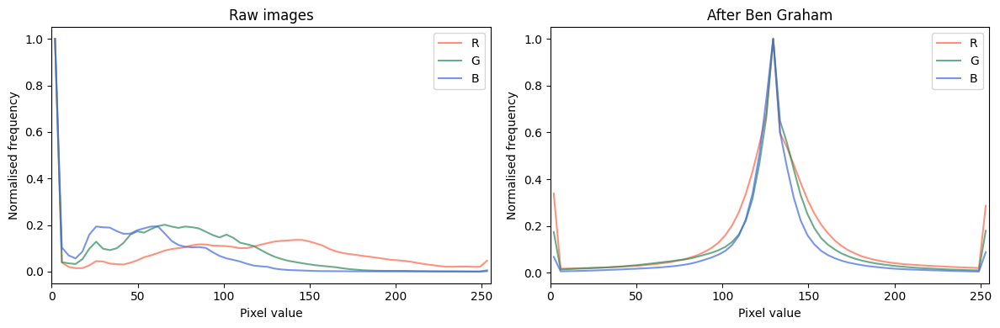

Saved: results/eyepacs_pixel_histograms.png


In [13]:
# Compare pixel histograms: raw vs Ben Graham output for 20 random images
sample_20 = df_valid.sample(20, random_state=7).reset_index(drop=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
colors_ch = [("tomato", "r"), ("seagreen", "g"), ("royalblue", "b")]

all_raw, all_proc = {"r": [], "g": [], "b": []}, {"r": [], "g": [], "b": []}

for _, row in sample_20.iterrows():
    img_bgr = cv2.imread(str(row["img_path"]))
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    proc    = ben_graham_preprocess(img_rgb, IMAGE_SIZE)
    for i, ch in enumerate(["r", "g", "b"]):
        all_raw[ch].extend(img_rgb[:, :, i].flatten().tolist())
        all_proc[ch].extend(proc[:, :, i].flatten().tolist())

for ax, title, data in [(axes[0], "Raw images", all_raw), (axes[1], "After Ben Graham", all_proc)]:
    for (color, ch_key) in colors_ch:
        vals = np.array(data[ch_key])
        hist, edges = np.histogram(vals, bins=64, range=(0, 255))
        ax.plot((edges[:-1] + edges[1:]) / 2, hist / hist.max(), color=color,
                alpha=0.7, label=ch_key.upper())
    ax.set_title(title)
    ax.set_xlabel("Pixel value")
    ax.set_ylabel("Normalised frequency")
    ax.legend()
    ax.set_xlim(0, 255)

plt.tight_layout()
plt.savefig(ROOT_DIR / "results" / "eyepacs_pixel_histograms.png", dpi=120, bbox_inches="tight")
plt.show()
print("Saved: results/eyepacs_pixel_histograms.png")

### 3.3 — Estimate processing time

In [14]:
import time

# Time 50 images to get a per-image estimate
BENCHMARK_N = 50
bench_df    = df_valid.sample(BENCHMARK_N, random_state=99).reset_index(drop=True)

t0 = time.perf_counter()
for _, row in bench_df.iterrows():
    img_bgr = cv2.imread(str(row["img_path"]))
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    _       = ben_graham_preprocess(img_rgb, IMAGE_SIZE)
t1 = time.perf_counter()

per_image_s  = (t1 - t0) / BENCHMARK_N
total_serial = per_image_s * len(df_valid)
total_par    = total_serial / NUM_WORKERS

print(f"Benchmarked on {BENCHMARK_N} images (single thread)")
print(f"Per-image time     : {per_image_s*1000:.1f} ms")
print(f"Total images       : {len(df_valid):,}")
print(f"Estimated serial   : {total_serial/60:.1f} min")
print(f"Estimated parallel : {total_par/60:.1f} min  ({NUM_WORKERS} workers)")

Benchmarked on 50 images (single thread)
Per-image time     : 19.9 ms
Total images       : 35,108
Estimated serial   : 11.6 min
Estimated parallel : 0.8 min  (15 workers)


## 4 — Preprocessing Run

> **This is the only section that writes to disk.**  
> Output: `data/eyepacs_processed/` (PNG) + `data/eyepacs_labels.csv`  
> Idempotent: already-processed images are skipped, so you can resume interrupted runs safely.

In [15]:

# ── Worker function (module-level for multiprocessing pickle-ability) ─────────
# We define it via exec so the notebook cell can define it at module scope.
# Alternatively, you can move this to scripts/preprocess_eyepacs.py later.

# Minimum mean green-channel pixel value (0–255) to accept an image.
# Images below this threshold are considered blank/black artifacts.
BLANK_THRESHOLD = 10.0

def _is_blank(img_bgr: np.ndarray, threshold: float = BLANK_THRESHOLD) -> bool:
    """Return True if the image is blank/black (mean green channel < threshold)."""
    return float(img_bgr[:, :, 1].mean()) < threshold


def _worker(args):
    """Process a single image.  Called by multiprocessing.Pool workers."""
    img_id, label, in_dir, out_dir, size = args
    out_path = Path(out_dir) / f"{img_id}.png"
    if out_path.exists():
        return img_id, label, "skipped", ""
    try:
        in_path = Path(in_dir) / f"{img_id}.jpeg"
        img_bgr = cv2.imread(str(in_path))
        if img_bgr is None:
            raise ValueError(f"cv2.imread returned None for {in_path}")
        # ── Blank / black image filter ────────────────────────────────────────
        if _is_blank(img_bgr):
            return img_id, label, "blank", f"mean_green={img_bgr[:,:,1].mean():.2f}"
        img_rgb  = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        proc_rgb = ben_graham_preprocess(img_rgb, size)   # contour-crop + resize + local contrast
        proc_bgr = cv2.cvtColor(proc_rgb, cv2.COLOR_RGB2BGR)
        cv2.imwrite(str(out_path), proc_bgr)
        return img_id, label, "ok", ""
    except Exception as exc:
        return img_id, label, "error", str(exc)

print(f"Worker function defined.  Blank threshold: mean green < {BLANK_THRESHOLD}")


Worker function defined.  Blank threshold: mean green < 10.0


In [16]:
# ── Create output directory ───────────────────────────────────────────────────
OUTPUT_IMG_DIR.mkdir(parents=True, exist_ok=True)
print(f"Output directory: {OUTPUT_IMG_DIR}")

# ── Build task list ───────────────────────────────────────────────────────────
tasks = [
    (row["id_code"], row["diagnosis"], str(RAW_IMG_DIR), str(OUTPUT_IMG_DIR), IMAGE_SIZE)
    for _, row in df_valid.iterrows()
]

# Pre-count already-done
already_done = sum(1 for _, row in df_valid.iterrows()
                   if (OUTPUT_IMG_DIR / f"{row['id_code']}.png").exists())
print(f"Total tasks    : {len(tasks):,}")
print(f"Already done   : {already_done:,}")
print(f"Left to process: {len(tasks) - already_done:,}")
print(f"Workers        : {NUM_WORKERS}")

Output directory: C:\Projects\dr-nrt\data\eyepacs_processed
Total tasks    : 35,108
Already done   : 0
Left to process: 35,108
Workers        : 15


In [17]:
# ── Run preprocessing in parallel ────────────────────────────────────────────
# NOTE: On Windows, spawn-based multiprocessing deadlocks in Jupyter because
#       child processes try to re-import __main__ (the notebook kernel).
#       ThreadPool is safe here — OpenCV releases the GIL for all its C ops
#       (imread, imwrite, GaussianBlur, addWeighted), so throughput is similar.

from multiprocessing.pool import ThreadPool

results_ok      = []   # (img_id, label)
results_skipped = []
results_blank   = []   # (img_id, mean_green) — black/artifact images, excluded
results_failed  = []   # (img_id, error_msg)

with ThreadPool(processes=NUM_WORKERS) as pool:
    for img_id, label, status, err in tqdm(
        pool.imap_unordered(_worker, tasks, chunksize=16),
        total=len(tasks),
        desc="Preprocessing",
    ):
        if status == "ok":
            results_ok.append((img_id, label))
        elif status == "skipped":
            results_skipped.append((img_id, label))
        elif status == "blank":
            results_blank.append((img_id, err))
        else:
            results_failed.append((img_id, err))

print(f"\nProcessed : {len(results_ok):,}")
print(f"Skipped   : {len(results_skipped):,}")
print(f"Blank/noise filtered: {len(results_blank):,}")
print(f"Failed    : {len(results_failed):,}")

if results_blank:
    print("\nFirst 10 filtered-out blank images:")
    for img_id, info in results_blank[:10]:
        print(f"  {img_id}  ({info})")

Preprocessing:   0%|          | 0/35108 [00:00<?, ?it/s]


Processed : 35,074
Skipped   : 0
Blank/noise filtered: 34
Failed    : 0

First 10 filtered-out blank images:
  669_left  (mean_green=4.14)
  551_left  (mean_green=9.13)
  1475_left  (mean_green=9.80)
  2516_left  (mean_green=7.99)
  2491_right  (mean_green=9.91)
  2857_right  (mean_green=8.36)
  3570_right  (mean_green=9.06)
  7085_left  (mean_green=5.56)
  9116_left  (mean_green=7.25)
  9116_right  (mean_green=9.54)


In [18]:

# ── Write output CSV  ─────────────────────────────────────────────────────────
# Combine ok + skipped (both are on disk); blank images are intentionally excluded.
all_success = results_ok + [(img_id, label) for img_id, label in results_skipped]

with open(OUTPUT_CSV, "w", newline="", encoding="utf-8") as f:
    writer = csv.writer(f)
    writer.writerow(["id_code", "diagnosis"])
    for img_id, label in sorted(all_success, key=lambda x: x[0]):
        writer.writerow([img_id, label])

print(f"Wrote {len(all_success):,} rows to {OUTPUT_CSV}")
print(f"Excluded (blank) : {len(results_blank):,}  — not written to CSV")

# ── Write failures + blank log ────────────────────────────────────────────────
all_failed = [(img_id, f"BLANK: {info}") for img_id, info in results_blank] + results_failed
if all_failed:
    with open(FAILED_LOG, "w", encoding="utf-8") as f:
        for img_id, err in all_failed:
            f.write(f"{img_id}\t{err}\n")
    print(f"Logged {len(all_failed)} issues to {FAILED_LOG}  "
          f"({len(results_blank)} blank, {len(results_failed)} errors)")
    if results_failed:
        print("\nFirst 10 errors:")
        for img_id, err in results_failed[:10]:
            print(f"  {img_id}: {err}")
else:
    print("No failures or blank images — clean run!")


Wrote 35,074 rows to C:\Projects\dr-nrt\data\eyepacs_labels.csv
Excluded (blank) : 34  — not written to CSV
Logged 34 issues to C:\Projects\dr-nrt\data\eyepacs_failed.txt  (34 blank, 0 errors)


## 5 — Post-Processing Verification

In [19]:
# ── Re-read the output CSV and compare to raw ─────────────────────────────────
df_out = pd.read_csv(OUTPUT_CSV)
print(f"Output CSV rows   : {len(df_out):,}")
print(f"Raw CSV rows      : {len(df_valid):,}")
print(f"Difference        : {len(df_valid) - len(df_out):,}  (expected = # failed)")
print(f"Output CSV shape  : {df_out.shape}")
print(f"Output columns    : {df_out.columns.tolist()}")
print()
# Confirm format matches APTOS train_label.csv
df_aptos_ref = pd.read_csv(APTOS_TRAIN_CSV)
print("APTOS train_label.csv columns :", df_aptos_ref.columns.tolist())
print("eyepacs_labels.csv columns    :", df_out.columns.tolist())
assert list(df_out.columns) == list(df_aptos_ref.columns), "COLUMN MISMATCH — check CSV"
print("\nColumn format matches APTOS CSV.")

Output CSV rows   : 35,074
Raw CSV rows      : 35,108
Difference        : 34  (expected = # failed)
Output CSV shape  : (35074, 2)
Output columns    : ['id_code', 'diagnosis']

APTOS train_label.csv columns : ['id_code', 'diagnosis']
eyepacs_labels.csv columns    : ['id_code', 'diagnosis']

Column format matches APTOS CSV.


In [20]:
# ── Output class distribution ─────────────────────────────────────────────────
out_counts = df_out["diagnosis"].value_counts().sort_index()
print("Output class distribution:")
for cls, name in enumerate(CLASS_NAMES):
    n = out_counts.get(cls, 0)
    pct = 100 * n / len(df_out)
    print(f"  [{cls}] {name:<18} {n:>6,}  ({pct:5.1f}%)")

Output class distribution:
  [0] No DR              25,781  ( 73.5%)
  [1] Mild                2,435  (  6.9%)
  [2] Moderate            5,281  ( 15.1%)
  [3] Severe                870  (  2.5%)
  [4] Proliferative         707  (  2.0%)


In [21]:
# ── Spot-check: verify output PNG dimensions and pixel range ──────────────────
spot_samples = df_out.sample(min(20, len(df_out)), random_state=3).reset_index(drop=True)
dim_errors, range_errors = [], []

for _, row in spot_samples.iterrows():
    p = OUTPUT_IMG_DIR / f"{row['id_code']}.png"
    if not p.exists():
        dim_errors.append(f"{row['id_code']}: file not found")
        continue
    img = cv2.imread(str(p))
    if img is None:
        dim_errors.append(f"{row['id_code']}: cv2 read error")
        continue
    h, w, c = img.shape
    if (h, w) != (IMAGE_SIZE, IMAGE_SIZE):
        dim_errors.append(f"{row['id_code']}: {w}x{h} expected {IMAGE_SIZE}x{IMAGE_SIZE}")
    if img.min() < 0 or img.max() > 255:
        range_errors.append(f"{row['id_code']}: pixel range [{img.min()}, {img.max()}]")

print(f"Spot-checked {len(spot_samples)} output images")
print(f"  Dimension errors : {len(dim_errors)}")
print(f"  Range errors     : {len(range_errors)}")
if dim_errors:
    print("  Dim issues:", dim_errors)
if range_errors:
    print("  Range issues:", range_errors)
if not dim_errors and not range_errors:
    print("  All checks passed.")

Spot-checked 20 output images
  Dimension errors : 0
  Range errors     : 0
  All checks passed.


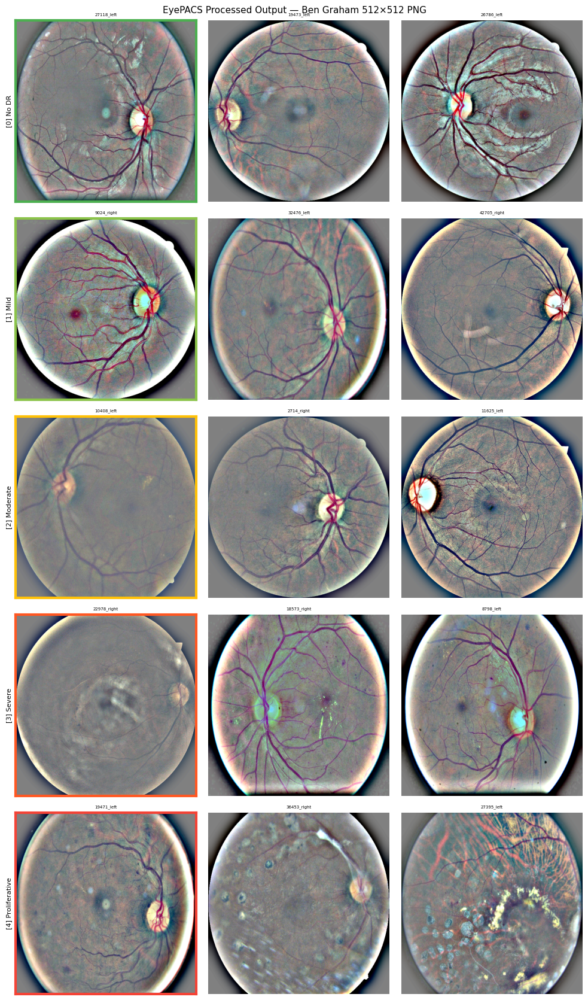

Saved: results/eyepacs_processed_samples.png


In [22]:
# ── Visual verification: processed samples by grade ───────────────────────────
N_SHOW = 3
fig, axes = plt.subplots(5, N_SHOW, figsize=(10, 17))

for cls in range(5):
    cls_df = df_out[df_out["diagnosis"] == cls]
    samples = cls_df.sample(min(N_SHOW, len(cls_df)), random_state=cls + 10).reset_index(drop=True)
    for j in range(N_SHOW):
        ax = axes[cls][j]
        if j < len(samples):
            p = OUTPUT_IMG_DIR / f"{samples.loc[j, 'id_code']}.png"
            img = cv2.imread(str(p))
            if img is not None:
                ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
                ax.set_title(samples.loc[j, "id_code"], fontsize=5)
        ax.axis("off")
        if j == 0:
            ax.set_ylabel(f"[{cls}] {CLASS_NAMES[cls]}", fontsize=8, rotation=90)
            ax.axis("on")
            ax.set_xticks([])
            ax.set_yticks([])
            for spine in ax.spines.values():
                spine.set_edgecolor(CLASS_COLORS[cls])
                spine.set_linewidth(3)

fig.suptitle("EyePACS Processed Output — Ben Graham 512×512 PNG", fontsize=11)
plt.tight_layout()
plt.savefig(ROOT_DIR / "results" / "eyepacs_processed_samples.png", dpi=100, bbox_inches="tight")
plt.show()
print("Saved: results/eyepacs_processed_samples.png")

## 6 — Summary

> Run this cell after Section 4 completes to get a final status report.

In [23]:
# Count PNGs actually on disk
n_png = len(list(OUTPUT_IMG_DIR.glob("*.png")))
n_csv = len(df_out)

print("══════════════════════════════════════════════")
print("  EyePACS Preprocessing — COMPLETE")
print("══════════════════════════════════════════════")
print(f"  PNG files on disk         : {n_png:,}")
print(f"  Rows in eyepacs_labels.csv: {n_csv:,}")
print(f"  PNG ↔ CSV match           : {'YES' if n_png == n_csv else 'NO — investigate'}")
print(f"  Output directory          : {OUTPUT_IMG_DIR}")
print(f"  Label CSV                 : {OUTPUT_CSV}")
print(f"  Failed log                : {FAILED_LOG if FAILED_LOG.exists() else 'N/A (no failures)'}")
print("══════════════════════════════════════════════")
print()
print("Next step: pass data/eyepacs_labels.csv to Phase B contrastive pre-training.")

══════════════════════════════════════════════
  EyePACS Preprocessing — COMPLETE
══════════════════════════════════════════════
  PNG files on disk         : 35,074
  Rows in eyepacs_labels.csv: 35,074
  PNG ↔ CSV match           : YES
  Output directory          : C:\Projects\dr-nrt\data\eyepacs_processed
  Label CSV                 : C:\Projects\dr-nrt\data\eyepacs_labels.csv
  Failed log                : C:\Projects\dr-nrt\data\eyepacs_failed.txt
══════════════════════════════════════════════

Next step: pass data/eyepacs_labels.csv to Phase B contrastive pre-training.
